Трансферное обучение

**Цель работы:** Исследовать различные подходы к трансферному обучению на примере задачи классификации изображений. В работе будут рассмотрены три популярные архитектуры (AlexNet, VGG16, Inception v3) и три стратегии их адаптации:
1.  **Замена классификатора:** Обучение только последнего, заново инициализированного слоя-классификатора.
2.  **Извлечение признаков (Feature Extraction):** Использование предобученной сети как экстрактора признаков с "замороженными" весами и обучение только нового классификатора.
3.  **Дообучение (Fine-Tuning):** Разморозка всех или части слоев сети и их дообучение на новой задаче с низким темпом обучения.

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import requests
import zipfile
from io import BytesIO


print(f"Используемая версия PyTorch: {torch.__version__}")
print(f"Используемая версия Torchvision: {torchvision.__version__}")

Используемая версия PyTorch: 2.6.0+cu124
Используемая версия Torchvision: 0.21.0+cu124


In [2]:
DATASET_URL = 'https://download.pytorch.org/tutorial/hymenoptera_data.zip'
DATA_DIR = 'hymenoptera_data'

print(f"Начинаем загрузку датасета ({DATA_DIR}.zip)...")
response = requests.get(DATASET_URL)
zip_archive = zipfile.ZipFile(BytesIO(response.content))
print("Архив успешно загружен. Распаковываем...")
zip_archive.extractall()
print("Данные готовы к использованию.")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Расчеты будут производиться на устройстве: {device}")

Начинаем загрузку датасета (hymenoptera_data.zip)...
Архив успешно загружен. Распаковываем...
Данные готовы к использованию.
Расчеты будут производиться на устройстве: cuda:0


In [3]:
# Определяем наборы трансформаций для обучающей и валидационной выборок.
# Inception v3 требует изображения размером 299x299, остальные модели - 224x224.

data_transforms = {
    # Трансформации для стандартных моделей (вход 224x224)
    'train_std': transforms.Compose([
        transforms.RandomResizedCrop(224), # Случайное кадрирование и изменение размера
        transforms.RandomHorizontalFlip(),   # Случайное горизонтальное отражение
        transforms.ToTensor(),               # Преобразование в тензор
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # Нормализация
    ]),
    'val_std': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224), # Центральное кадрирование
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    # Трансформации для Inception v3 (вход 299x299)
    'train_inc': transforms.Compose([
        transforms.RandomResizedCrop(299),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val_inc': transforms.Compose([
        transforms.Resize(320),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}
print("Трансформации для изображений определены.")

Трансформации для изображений определены.


In [4]:
# Для моделей с входом 224x224
image_datasets_224 = {x: datasets.ImageFolder(os.path.join(DATA_DIR, x), data_transforms[x+'_std'])
                      for x in ['train', 'val']}
dataloaders_224 = {x: torch.utils.data.DataLoader(image_datasets_224[x], batch_size=2, shuffle=True, num_workers=2)
                   for x in ['train', 'val']}
dataset_sizes_224 = {x: len(image_datasets_224[x]) for x in ['train', 'val']}

# Для Inception v3 с входом 299x299
image_datasets_299 = {x: datasets.ImageFolder(os.path.join(DATA_DIR, x), data_transforms[x+'_inc'])
                      for x in ['train', 'val']}
dataloaders_299 = {x: torch.utils.data.DataLoader(image_datasets_299[x], batch_size=2, shuffle=True, num_workers=2)
                   for x in ['train', 'val']}
dataset_sizes_299 = {x: len(image_datasets_299[x]) for x in ['train', 'val']}

class_names = image_datasets_224['train'].classes
print(f"Загрузчики данных созданы. Классы: {class_names}")

Загрузчики данных созданы. Классы: ['ants', 'bees']


## Вспомогательные функции

Здесь определены функции для проведения цикла обучения, визуализации результатов и демонстрации работы модели.

In [5]:
def train_model(model, criterion, optimizer, scheduler, dataloaders, dataset_sizes, num_epochs=25, is_inception=False):
    """Основная функция для тренировки и валидации модели."""
    start_timestamp = time.time()

    # Сохраняем начальные веса для последующего восстановления лучшей модели
    best_model_weights = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # Словарь для хранения истории обучения
    history = {'train_loss': [], 'val_loss': [], 'train_acc': [], 'val_acc': []}

    for epoch in range(num_epochs):
        print(f'Эпоха {epoch + 1}/{num_epochs}')
        print('-' * 10)

        # Каждая эпоха имеет фазу обучения и фазу валидации
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Установить модель в режим обучения
            else:
                model.eval()   # Установить модель в режим оценки

            running_loss = 0.0
            running_corrects = 0

            # Итерация по данным
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # Обнуляем градиенты
                optimizer.zero_grad()

                # Прямой проход
                # Отслеживаем историю только в фазе обучения
                with torch.set_grad_enabled(phase == 'train'):
                    # Inception V3 имеет специальный дополнительный выход
                    if is_inception and phase == 'train':
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4 * loss2 # Взвешенная сумма потерь
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # Обратный проход и оптимизация только в фазе обучения
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Сбор статистики
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            history[f'{phase}_loss'].append(epoch_loss)
            history[f'{phase}_acc'].append(epoch_acc.cpu().numpy())

            print(f'  Фаза: {phase.upper()} | Потери: {epoch_loss:.4f} | Точность: {epoch_acc:.4f}')

            # Глубокое копирование модели, если достигнута лучшая точность
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_weights = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - start_timestamp
    print(f'Тренировка завершена за {time_elapsed // 60:.0f}м {time_elapsed % 60:.0f}с')
    print(f'Лучшая точность на валидации: {best_acc:.4f}')

    # Загружаем лучшие веса
    model.load_state_dict(best_model_weights)
    return model, history

In [6]:
def plot_history(history, title):
    """Визуализация кривых обучения и валидации."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))
    fig.suptitle(title, fontsize=20)

    # График потерь
    ax1.plot(history['train_loss'], label='Потери на обучении', color='#d35400', marker='o')
    ax1.plot(history['val_loss'], label='Потери на валидации', color='#2980b9', marker='o')
    ax1.set_title('Динамика функции потерь', fontsize=14)
    ax1.set_xlabel('Эпоха', fontsize=12)
    ax1.set_ylabel('Значение потерь', fontsize=12)
    ax1.legend()
    ax1.grid(True)

    # График точности
    ax2.plot(history['train_acc'], label='Точность на обучении', color='#d35400', marker='x')
    ax2.plot(history['val_acc'], label='Точность на валидации', color='#2980b9', marker='x')
    ax2.set_title('Динамика точности', fontsize=14)
    ax2.set_xlabel('Эпоха', fontsize=12)
    ax2.set_ylabel('Значение точности', fontsize=12)
    ax2.legend()
    ax2.grid(True)

    plt.show()

In [7]:
def visualize_model_predictions(model, dataloader, num_images=6):
    """Отображение предсказаний модели на нескольких примерах."""
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure(figsize=(15, 10))

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                is_correct = preds[j] == labels[j]
                title_color = 'green' if is_correct else 'red'
                ax.set_title(f'Прогноз: {class_names[preds[j]]} | Истина: {class_names[labels[j]]}', color=title_color)

                # Визуализация изображения (с денормализацией)
                img = inputs.cpu().data[j].numpy().transpose((1, 2, 0))
                mean = np.array([0.485, 0.456, 0.406])
                std = np.array([0.229, 0.224, 0.225])
                img = std * img + mean
                img = np.clip(img, 0, 1)
                plt.imshow(img)

                if images_so_far == num_images:
                    model.train(mode=was_training) # Восстанавливаем режим модели
                    plt.tight_layout()
                    plt.show()
                    return
        model.train(mode=was_training)

## Эксперимент 1: Архитектура AlexNet

### 1.1. Подход "Замена классификатора"

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:01<00:00, 183MB/s]


Начинаем тренировку AlexNet (замена классификатора)...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.7844 | Точность: 0.8279
  Фаза: VAL | Потери: 4.8173 | Точность: 0.6601

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 1.6652 | Точность: 0.8525
  Фаза: VAL | Потери: 2.9255 | Точность: 0.8105

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 1.6227 | Точность: 0.8566
  Фаза: VAL | Потери: 1.1342 | Точность: 0.9150

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.5449 | Точность: 0.9180
  Фаза: VAL | Потери: 1.8586 | Точность: 0.8824

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 1.1820 | Точность: 0.9262
  Фаза: VAL | Потери: 1.4719 | Точность: 0.8954

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.9268 | Точность: 0.9098
  Фаза: VAL | Потери: 0.7810 | Точность: 0.9216

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.8404 | Точность: 0.9057
  Фаза: VAL | Потери: 1.4189 | Точность: 0.9085

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.7453 | Точность: 0.9385
  Фаза: VAL | Потери: 1.33

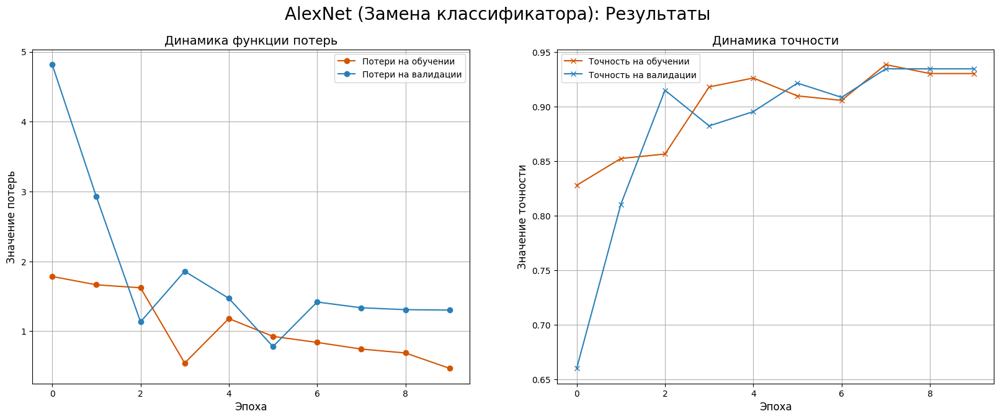

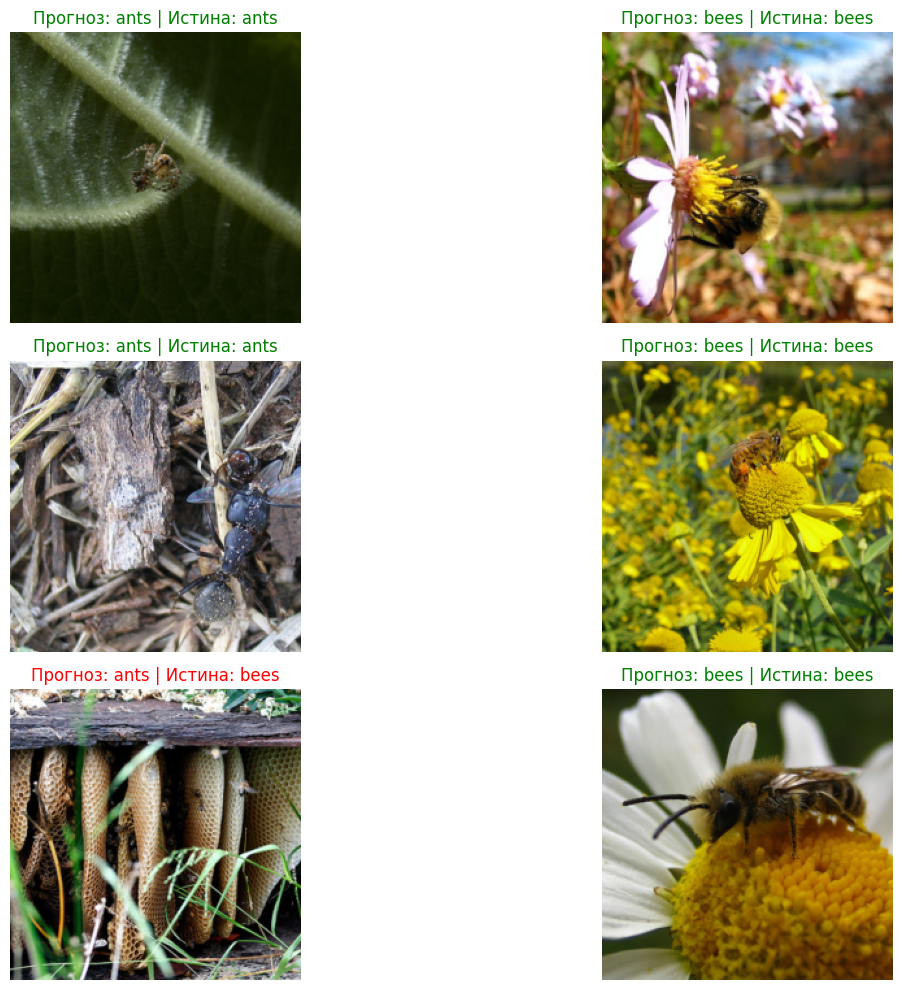

In [8]:
# Загружаем предобученную модель AlexNet
model_alexnet_v1 = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)

# Заменяем последний полносвязный слой на новый, соответствующий нашей задаче (2 класса)
num_ftrs = model_alexnet_v1.classifier[6].in_features
model_alexnet_v1.classifier[6] = nn.Linear(num_ftrs, len(class_names))
model_alexnet_v1 = model_alexnet_v1.to(device)

# Определяем функцию потерь
criterion = nn.CrossEntropyLoss()

# Создаем оптимизатор, который будет обновлять веса только нового слоя
optimizer_alex_v1 = optim.SGD(model_alexnet_v1.classifier[6].parameters(), lr=0.001, momentum=0.9)

# Планировщик для изменения скорости обучения
scheduler_alex_v1 = lr_scheduler.StepLR(optimizer_alex_v1, step_size=7, gamma=0.1)

print("Начинаем тренировку AlexNet (замена классификатора)...")
model_alexnet_v1, history_alex_v1 = train_model(model_alexnet_v1, criterion, optimizer_alex_v1, scheduler_alex_v1,
                                              dataloaders_224, dataset_sizes_224, num_epochs=10)

plot_history(history_alex_v1, "AlexNet (Замена классификатора): Результаты")
visualize_model_predictions(model_alexnet_v1, dataloaders_224['val'])

### 1.2. Подход "Извлечение признаков"

Начинаем тренировку AlexNet (извлечение признаков)...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.4430 | Точность: 0.7869
  Фаза: VAL | Потери: 1.5235 | Точность: 0.8627

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 1.8399 | Точность: 0.8648
  Фаза: VAL | Потери: 1.4935 | Точность: 0.8627

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 1.4300 | Точность: 0.8852
  Фаза: VAL | Потери: 2.0346 | Точность: 0.8627

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 1.2741 | Точность: 0.8811
  Фаза: VAL | Потери: 1.4588 | Точность: 0.8889

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 1.0347 | Точность: 0.9057
  Фаза: VAL | Потери: 1.7446 | Точность: 0.8431

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.7940 | Точность: 0.9057
  Фаза: VAL | Потери: 1.5457 | Точность: 0.9020

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.5399 | Точность: 0.9221
  Фаза: VAL | Потери: 1.5844 | Точность: 0.9020

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.2635 | Точность: 0.9549
  Фаза: VAL | Потери: 1.442

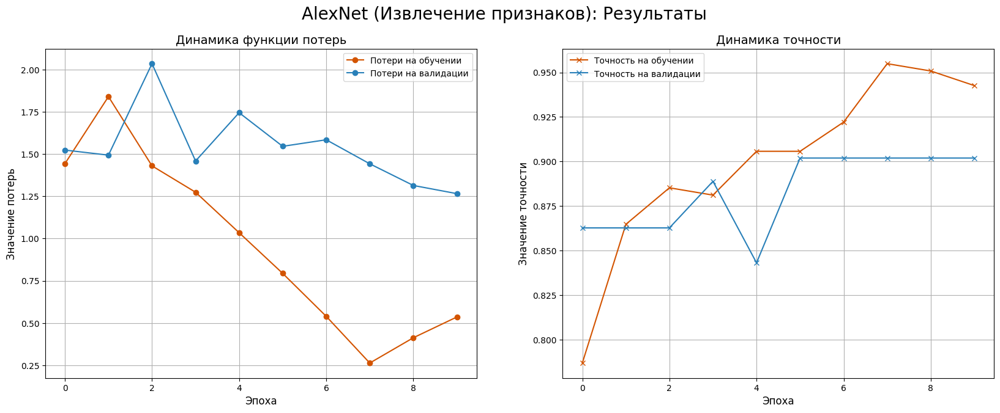

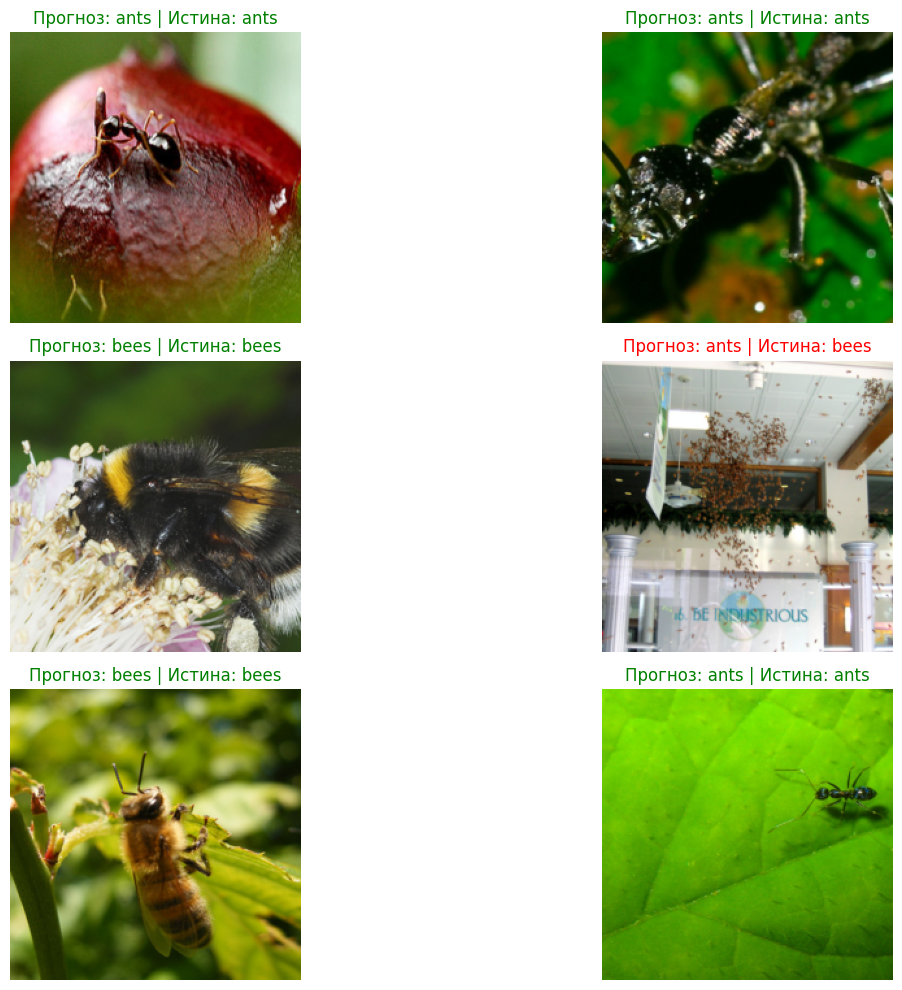

In [9]:
# Загружаем предобученную модель
model_alexnet_v2 = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)

# "Замораживаем" все веса сверточной части сети
for param in model_alexnet_v2.parameters():
    param.requires_grad = False

# Заменяем классификатор. Новый слой будет иметь `requires_grad=True` по умолчанию
num_ftrs = model_alexnet_v2.classifier[6].in_features
model_alexnet_v2.classifier[6] = nn.Linear(num_ftrs, len(class_names))
model_alexnet_v2 = model_alexnet_v2.to(device)

criterion = nn.CrossEntropyLoss()

# Оптимизатор будет обновлять только параметры нового классификатора
optimizer_alex_v2 = optim.SGD(model_alexnet_v2.classifier[6].parameters(), lr=0.001, momentum=0.9)
scheduler_alex_v2 = lr_scheduler.StepLR(optimizer_alex_v2, step_size=7, gamma=0.1)

print("Начинаем тренировку AlexNet (извлечение признаков)...")
model_alexnet_v2, history_alex_v2 = train_model(model_alexnet_v2, criterion, optimizer_alex_v2, scheduler_alex_v2,
                                              dataloaders_224, dataset_sizes_224, num_epochs=10)

plot_history(history_alex_v2, "AlexNet (Извлечение признаков): Результаты")
visualize_model_predictions(model_alexnet_v2, dataloaders_224['val'])

### 1.3. Подход "Дообучение" (Fine-Tuning)

Начинаем дообучение (fine-tuning) модели AlexNet...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.3657 | Точность: 0.4713
  Фаза: VAL | Потери: 0.6894 | Точность: 0.5425

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 0.7102 | Точность: 0.5287
  Фаза: VAL | Потери: 0.6992 | Точность: 0.4575

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 0.6964 | Точность: 0.5246
  Фаза: VAL | Потери: 0.7469 | Точность: 0.4575

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.7107 | Точность: 0.4836
  Фаза: VAL | Потери: 0.7245 | Точность: 0.4575

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 0.6998 | Точность: 0.4631
  Фаза: VAL | Потери: 0.6932 | Точность: 0.4575

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.7060 | Точность: 0.4139
  Фаза: VAL | Потери: 0.7064 | Точность: 0.4575

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.7020 | Точность: 0.4672
  Фаза: VAL | Потери: 0.7152 | Точность: 0.4575

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.6992 | Точность: 0.5041
  Фаза: VAL | Потери: 0.7017 

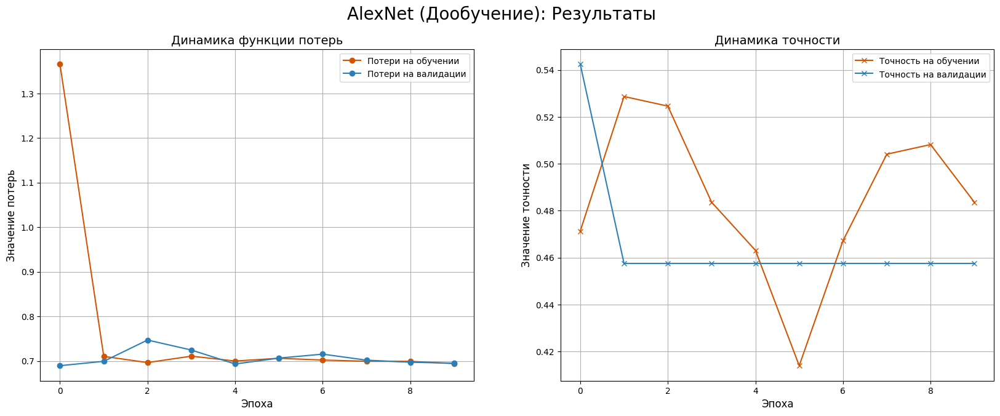

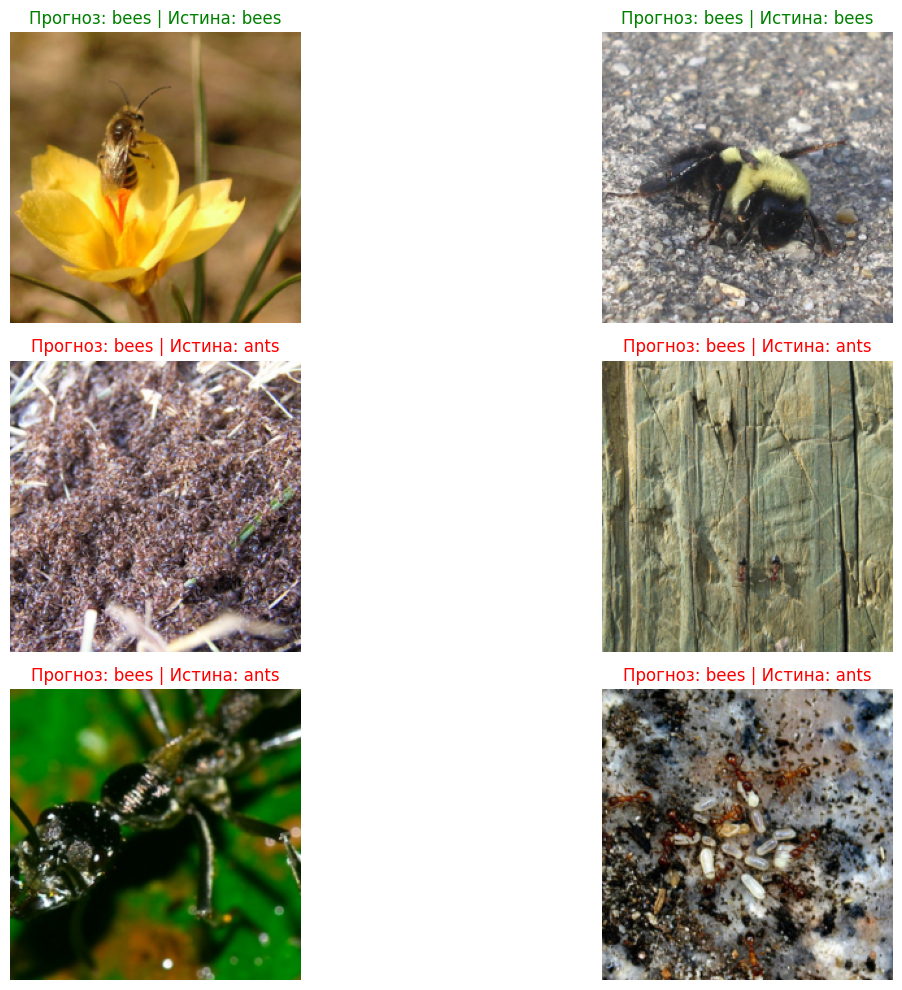

In [10]:
# Загружаем предобученную модель
model_alexnet_v3 = models.alexnet(weights=models.AlexNet_Weights.DEFAULT)

# Модифицируем классификатор
num_ftrs = model_alexnet_v3.classifier[6].in_features
model_alexnet_v3.classifier[6] = nn.Linear(num_ftrs, len(class_names))
model_alexnet_v3 = model_alexnet_v3.to(device)

criterion = nn.CrossEntropyLoss()

# В этом подходе мы обучаем все параметры сети. `requires_grad` по умолчанию True
optimizer_alex_v3 = optim.SGD(model_alexnet_v3.parameters(), lr=0.001, momentum=0.9)
scheduler_alex_v3 = lr_scheduler.StepLR(optimizer_alex_v3, step_size=7, gamma=0.1)

print("Начинаем дообучение (fine-tuning) модели AlexNet...")
model_alexnet_v3, history_alex_v3 = train_model(model_alexnet_v3, criterion, optimizer_alex_v3, scheduler_alex_v3,
                                                dataloaders_224, dataset_sizes_224, num_epochs=10)

plot_history(history_alex_v3, "AlexNet (Дообучение): Результаты")
visualize_model_predictions(model_alexnet_v3, dataloaders_224['val'])

## Эксперимент 2: Архитектура VGG16

### 2.1. Подход "Замена классификатора"

In [11]:
import torch
import gc

gc.collect()
torch.cuda.empty_cache()

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 146MB/s]


Начинаем тренировку VGG16 (замена классификатора)...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.5576 | Точность: 0.7992
  Фаза: VAL | Потери: 0.2289 | Точность: 0.9346

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 0.2773 | Точность: 0.9385
  Фаза: VAL | Потери: 0.2503 | Точность: 0.9542

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 0.5617 | Точность: 0.8934
  Фаза: VAL | Потери: 0.3193 | Точность: 0.9477

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.1886 | Точность: 0.9467
  Фаза: VAL | Потери: 0.2992 | Точность: 0.9412

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 0.1560 | Точность: 0.9426
  Фаза: VAL | Потери: 0.2738 | Точность: 0.9542

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.3721 | Точность: 0.9426
  Фаза: VAL | Потери: 0.2723 | Точность: 0.9412

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.4403 | Точность: 0.9180
  Фаза: VAL | Потери: 0.3343 | Точность: 0.9542

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.2290 | Точность: 0.9549
  Фаза: VAL | Потери: 0.3433

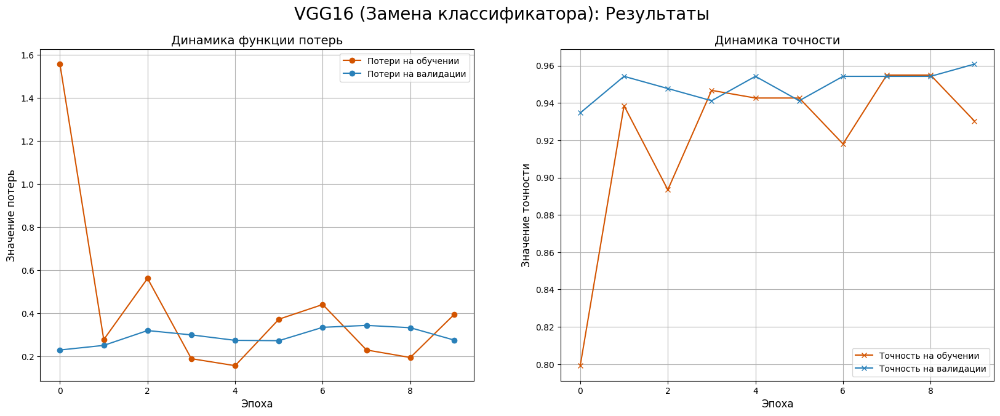

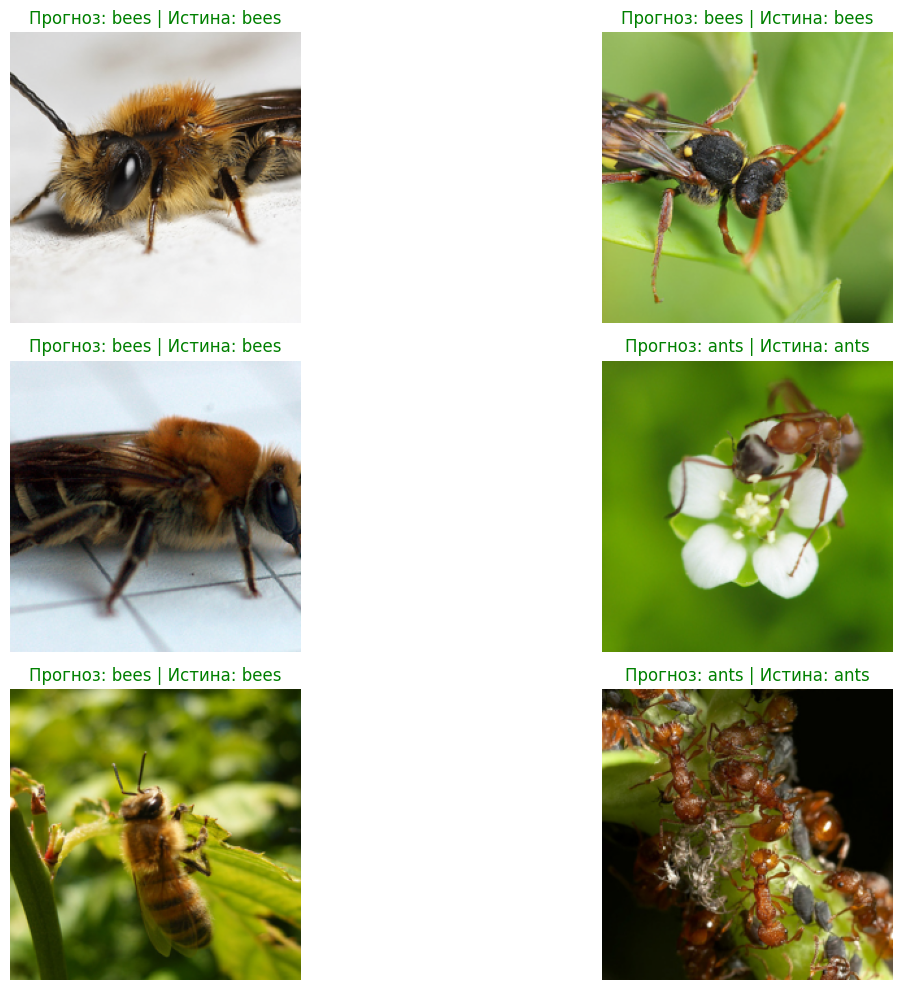

In [12]:
model_vgg16_v1 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)

num_ftrs = model_vgg16_v1.classifier[6].in_features
model_vgg16_v1.classifier[6] = nn.Linear(num_ftrs, len(class_names))

gc.collect()
torch.cuda.empty_cache()

model_vgg16_v1 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)

# Замораживаем все параметры фичей
for param in model_vgg16_v1.features.parameters():
    param.requires_grad = False

model_vgg16_v1 = model_vgg16_v1.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_vgg_v1 = optim.SGD(model_vgg16_v1.classifier[6].parameters(), lr=0.001, momentum=0.9)
scheduler_vgg_v1 = lr_scheduler.StepLR(optimizer_vgg_v1, step_size=7, gamma=0.1)

print("Начинаем тренировку VGG16 (замена классификатора)...")
model_vgg16_v1, history_vgg_v1 = train_model(model_vgg16_v1, criterion, optimizer_vgg_v1, scheduler_vgg_v1,
                                           dataloaders_224, dataset_sizes_224, num_epochs=10)

plot_history(history_vgg_v1, "VGG16 (Замена классификатора): Результаты")
visualize_model_predictions(model_vgg16_v1, dataloaders_224['val'])

### 2.2. Подход "Извлечение признаков"

Начинаем тренировку VGG16 (извлечение признаков)...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 0.3771 | Точность: 0.8607
  Фаза: VAL | Потери: 0.2331 | Точность: 0.9412

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 0.3063 | Точность: 0.9385
  Фаза: VAL | Потери: 0.7008 | Точность: 0.8301

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 0.2496 | Точность: 0.9098
  Фаза: VAL | Потери: 0.1771 | Точность: 0.9673

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.2495 | Точность: 0.9385
  Фаза: VAL | Потери: 0.0820 | Точность: 0.9739

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 0.3102 | Точность: 0.9426
  Фаза: VAL | Потери: 0.1527 | Точность: 0.9739

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.3883 | Точность: 0.9303
  Фаза: VAL | Потери: 0.1507 | Точность: 0.9739

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.2158 | Точность: 0.9672
  Фаза: VAL | Потери: 0.1200 | Точность: 0.9804

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.3148 | Точность: 0.9508
  Фаза: VAL | Потери: 0.1106 

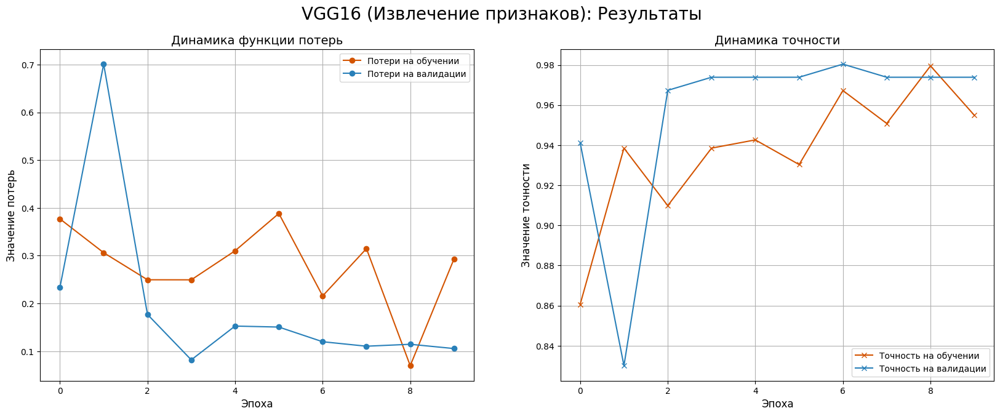

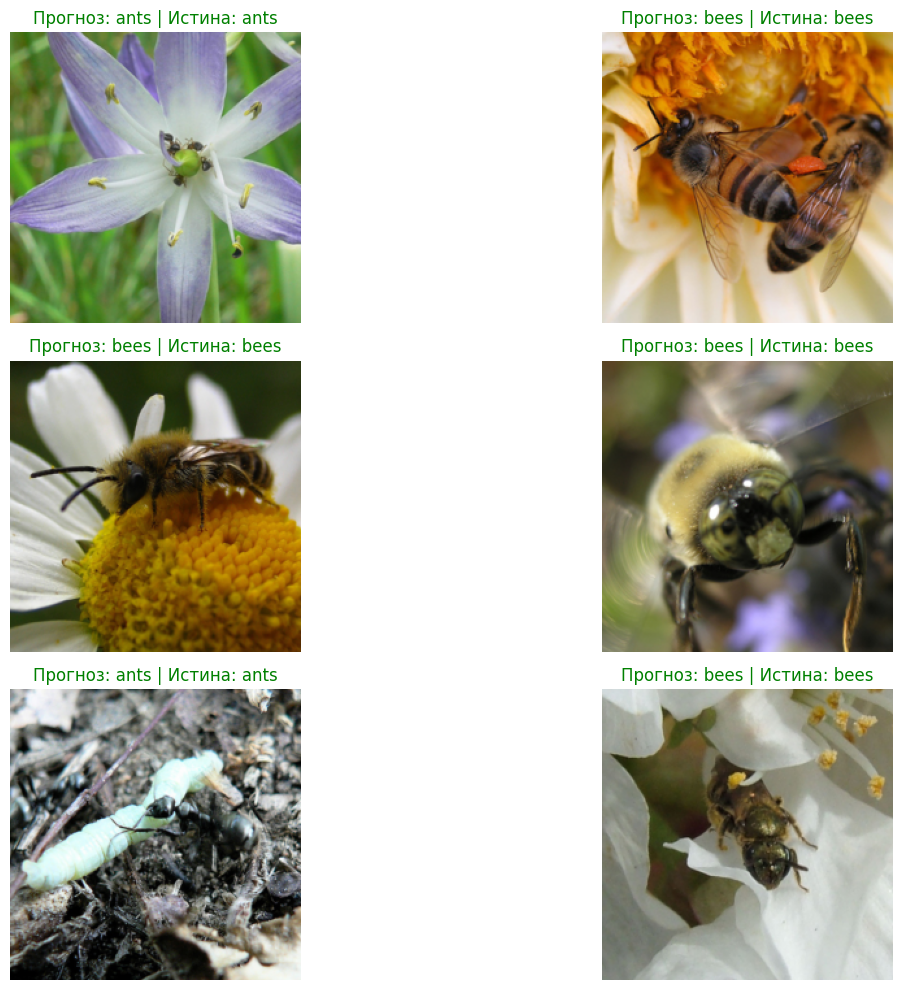

In [13]:
model_vgg16_v2 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)

for param in model_vgg16_v2.parameters():
    param.requires_grad = False

num_ftrs = model_vgg16_v2.classifier[6].in_features
model_vgg16_v2.classifier[6] = nn.Linear(num_ftrs, len(class_names))
model_vgg16_v2 = model_vgg16_v2.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_vgg_v2 = optim.SGD(model_vgg16_v2.classifier[6].parameters(), lr=0.001, momentum=0.9)
scheduler_vgg_v2 = lr_scheduler.StepLR(optimizer_vgg_v2, step_size=7, gamma=0.1)

print("Начинаем тренировку VGG16 (извлечение признаков)...")
model_vgg16_v2, history_vgg_v2 = train_model(model_vgg16_v2, criterion, optimizer_vgg_v2, scheduler_vgg_v2,
                                           dataloaders_224, dataset_sizes_224, num_epochs=10)

plot_history(history_vgg_v2, "VGG16 (Извлечение признаков): Результаты")
visualize_model_predictions(model_vgg16_v2, dataloaders_224['val'])

### 2.3. Подход "Дообучение" (Fine-Tuning)

Начинаем дообучение (fine-tuning) модели VGG16...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.0178 | Точность: 0.5574
  Фаза: VAL | Потери: 0.6543 | Точность: 0.5752

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 0.7607 | Точность: 0.5246
  Фаза: VAL | Потери: 0.6845 | Точность: 0.4902

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 0.7043 | Точность: 0.5902
  Фаза: VAL | Потери: 0.4481 | Точность: 0.8170

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.6637 | Точность: 0.6393
  Фаза: VAL | Потери: 0.6301 | Точность: 0.6144

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 0.6718 | Точность: 0.6762
  Фаза: VAL | Потери: 0.5816 | Точность: 0.7320

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.6010 | Точность: 0.6967
  Фаза: VAL | Потери: 0.6377 | Точность: 0.6928

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.5863 | Точность: 0.6844
  Фаза: VAL | Потери: 0.3763 | Точность: 0.8758

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.3738 | Точность: 0.8484
  Фаза: VAL | Потери: 0.3098 | 

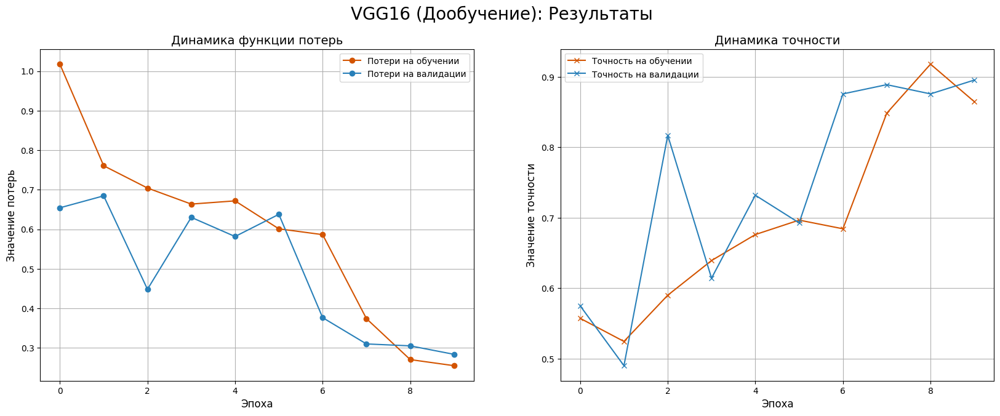

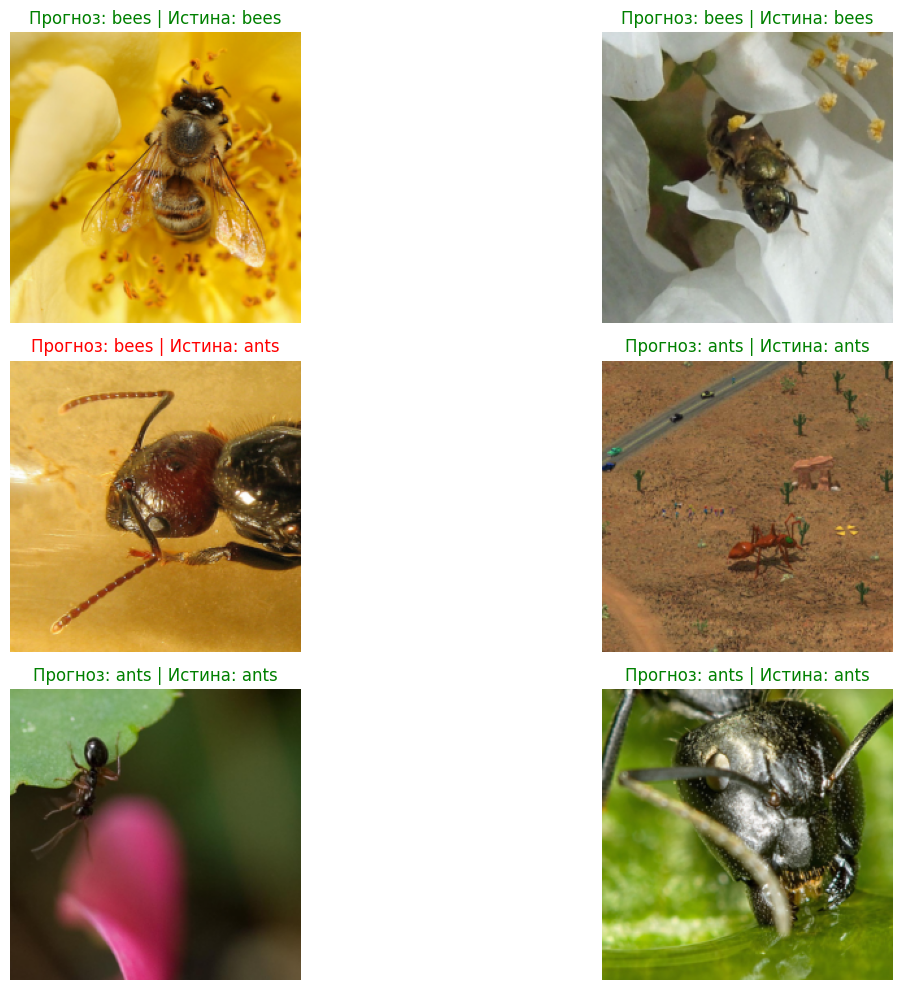

In [14]:
model_vgg16_v3 = models.vgg16(weights=models.VGG16_Weights.DEFAULT)

num_ftrs = model_vgg16_v3.classifier[6].in_features
model_vgg16_v3.classifier[6] = nn.Linear(num_ftrs, len(class_names))
model_vgg16_v3 = model_vgg16_v3.to(device)

criterion = nn.CrossEntropyLoss()
optimizer_vgg_v3 = optim.SGD(model_vgg16_v3.parameters(), lr=0.001, momentum=0.9)
scheduler_vgg_v3 = lr_scheduler.StepLR(optimizer_vgg_v3, step_size=7, gamma=0.1)

print("Начинаем дообучение (fine-tuning) модели VGG16...")
model_vgg16_v3, history_vgg_v3 = train_model(model_vgg16_v3, criterion, optimizer_vgg_v3, scheduler_vgg_v3,
                                             dataloaders_224, dataset_sizes_224, num_epochs=10)

plot_history(history_vgg_v3, "VGG16 (Дообучение): Результаты")
visualize_model_predictions(model_vgg16_v3, dataloaders_224['val'])

## Эксперимент 3: Архитектура Inception v3

### 3.1. Подход "Замена классификатора"

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth
100%|██████████| 104M/104M [00:00<00:00, 214MB/s]


Начинаем тренировку Inception v3 (замена классификатора)...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 0.9922 | Точность: 0.5656
  Фаза: VAL | Потери: 0.5403 | Точность: 0.6340

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 0.9377 | Точность: 0.6557
  Фаза: VAL | Потери: 0.3858 | Точность: 0.7974

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 0.9732 | Точность: 0.6352
  Фаза: VAL | Потери: 0.3167 | Точность: 0.9020

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.9762 | Точность: 0.6434
  Фаза: VAL | Потери: 0.5623 | Точность: 0.6928

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 0.9420 | Точность: 0.6680
  Фаза: VAL | Потери: 0.2475 | Точность: 0.9150

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 1.0247 | Точность: 0.6598
  Фаза: VAL | Потери: 0.3010 | Точность: 0.8889

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 1.0359 | Точность: 0.6352
  Фаза: VAL | Потери: 0.4203 | Точность: 0.8039

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.8941 | Точность: 0.6844
  Фаза: VAL | Потери:

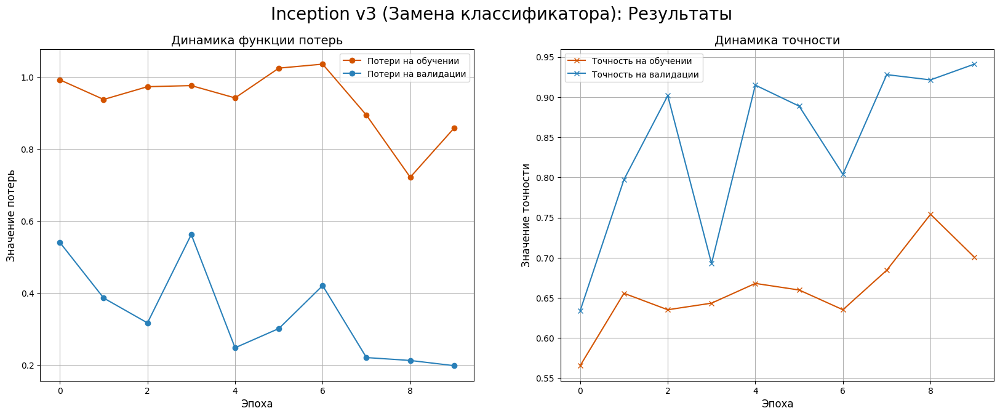

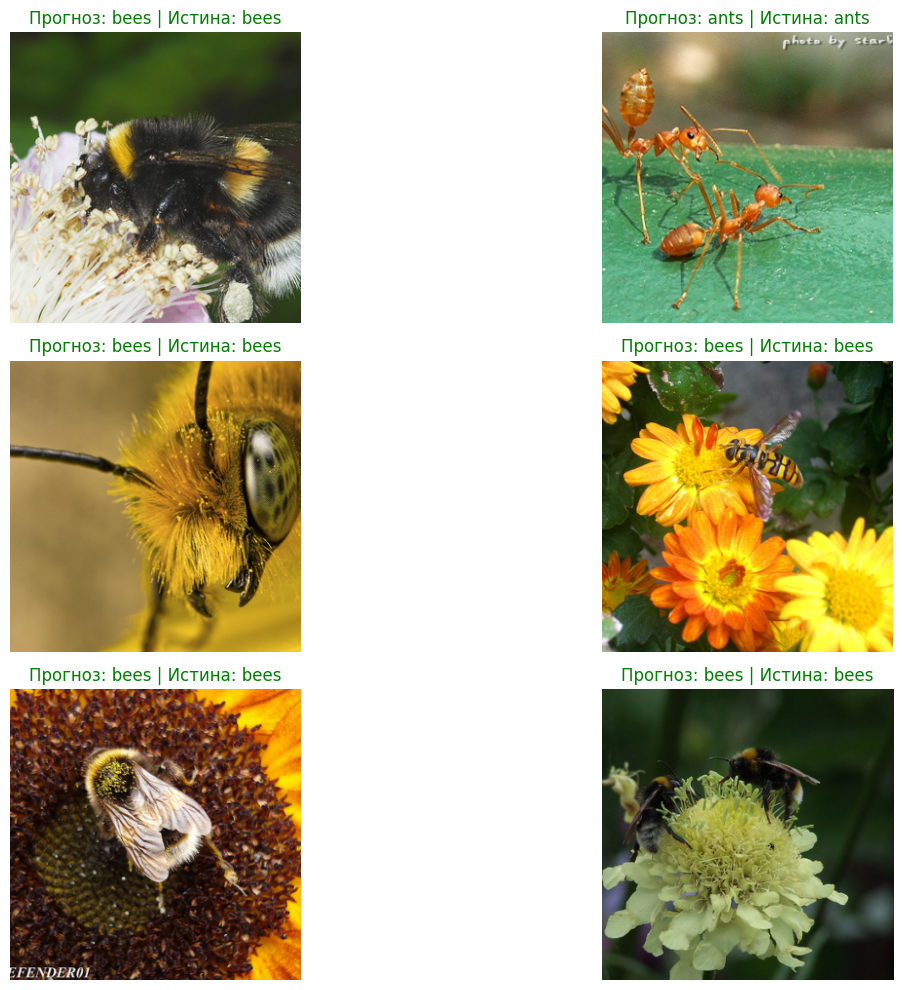

In [15]:
model_inception_v1 = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)

# Inception v3 имеет основной и вспомогательный (auxiliary) выходы
# Модифицируем оба
aux_num_ftrs = model_inception_v1.AuxLogits.fc.in_features
model_inception_v1.AuxLogits.fc = nn.Linear(aux_num_ftrs, len(class_names))

main_num_ftrs = model_inception_v1.fc.in_features
model_inception_v1.fc = nn.Linear(main_num_ftrs, len(class_names))
model_inception_v1 = model_inception_v1.to(device)

criterion = nn.CrossEntropyLoss()

# В оптимизатор передаем параметры только новых слоев
params_to_update_v1 = list(model_inception_v1.fc.parameters()) + list(model_inception_v1.AuxLogits.fc.parameters())
optimizer_inc_v1 = optim.SGD(params_to_update_v1, lr=0.001, momentum=0.9)
scheduler_inc_v1 = lr_scheduler.StepLR(optimizer_inc_v1, step_size=7, gamma=0.1)

print("Начинаем тренировку Inception v3 (замена классификатора)...")
model_inception_v1, history_inc_v1 = train_model(model_inception_v1, criterion, optimizer_inc_v1, scheduler_inc_v1,
                                                 dataloaders_299, dataset_sizes_299, num_epochs=10, is_inception=True)

plot_history(history_inc_v1, "Inception v3 (Замена классификатора): Результаты")
visualize_model_predictions(model_inception_v1, dataloaders_299['val'])

### 3.2. Подход "Извлечение признаков"

Начинаем тренировку Inception v3 (извлечение признаков)...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.0262 | Точность: 0.5574
  Фаза: VAL | Потери: 0.9678 | Точность: 0.4575

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 0.8847 | Точность: 0.6721
  Фаза: VAL | Потери: 0.2867 | Точность: 0.8824

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 0.7898 | Точность: 0.7418
  Фаза: VAL | Потери: 0.3221 | Точность: 0.8824

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 1.2140 | Точность: 0.6393
  Фаза: VAL | Потери: 0.4865 | Точность: 0.7712

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 1.1108 | Точность: 0.6230
  Фаза: VAL | Потери: 0.2589 | Точность: 0.8954

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.8592 | Точность: 0.6926
  Фаза: VAL | Потери: 0.2722 | Точность: 0.8824

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.9929 | Точность: 0.6762
  Фаза: VAL | Потери: 0.2609 | Точность: 0.9150

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.9160 | Точность: 0.6762
  Фаза: VAL | Потери: 

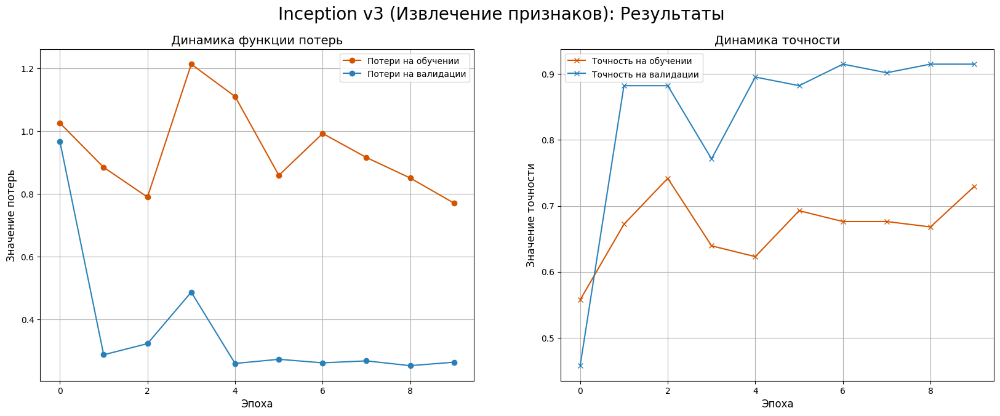

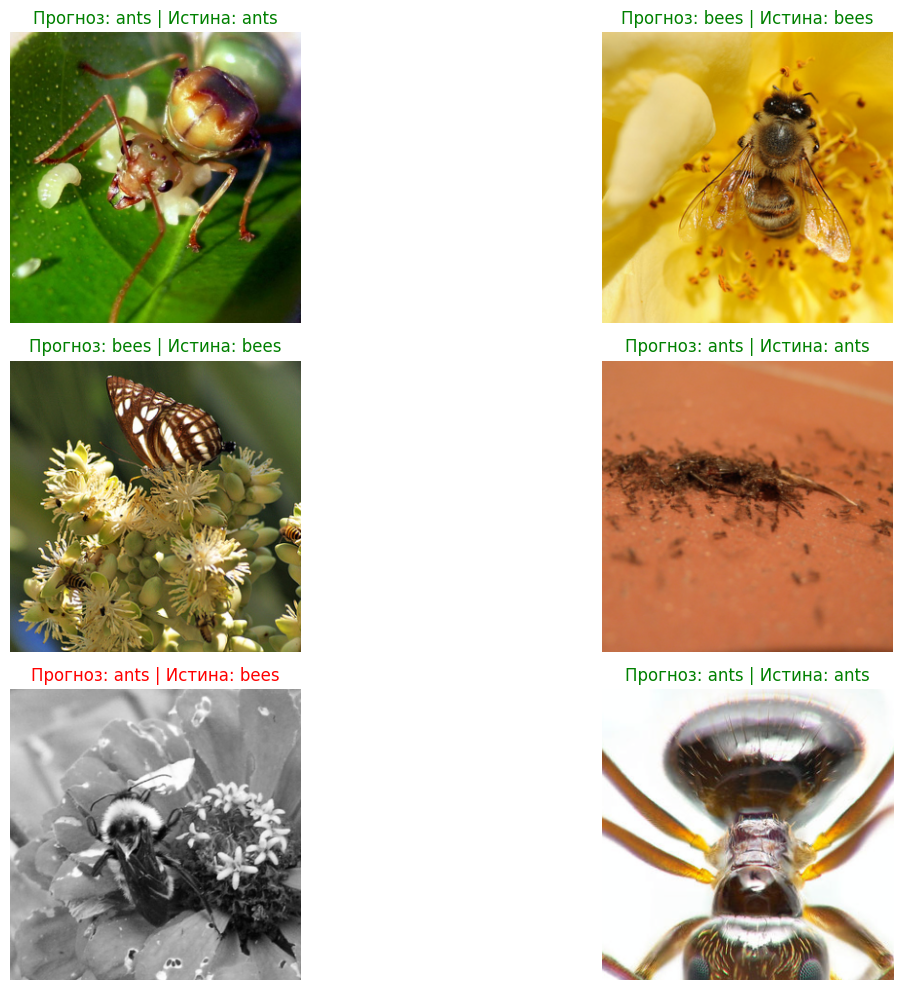

In [16]:
model_inception_v2 = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)

# Замораживаем все веса
for param in model_inception_v2.parameters():
    param.requires_grad = False

# Модифицируем классификаторы (они создаются с requires_grad=True)
aux_num_ftrs = model_inception_v2.AuxLogits.fc.in_features
model_inception_v2.AuxLogits.fc = nn.Linear(aux_num_ftrs, len(class_names))
main_num_ftrs = model_inception_v2.fc.in_features
model_inception_v2.fc = nn.Linear(main_num_ftrs, len(class_names))
model_inception_v2 = model_inception_v2.to(device)

criterion = nn.CrossEntropyLoss()

# Оптимизируем только новые слои
params_to_update_v2 = list(model_inception_v2.fc.parameters()) + list(model_inception_v2.AuxLogits.fc.parameters())
optimizer_inc_v2 = optim.SGD(params_to_update_v2, lr=0.001, momentum=0.9)
scheduler_inc_v2 = lr_scheduler.StepLR(optimizer_inc_v2, step_size=7, gamma=0.1)

print("Начинаем тренировку Inception v3 (извлечение признаков)...")
model_inception_v2, history_inc_v2 = train_model(model_inception_v2, criterion, optimizer_inc_v2, scheduler_inc_v2,
                                                 dataloaders_299, dataset_sizes_299, num_epochs=10, is_inception=True)

plot_history(history_inc_v2, "Inception v3 (Извлечение признаков): Результаты")
visualize_model_predictions(model_inception_v2, dataloaders_299['val'])

### 3.3. Подход "Дообучение" (Fine-Tuning)

Начинаем дообучение (fine-tuning) модели Inception v3...
Эпоха 1/10
----------
  Фаза: TRAIN | Потери: 1.1348 | Точность: 0.6025
  Фаза: VAL | Потери: 0.3812 | Точность: 0.8366

Эпоха 2/10
----------
  Фаза: TRAIN | Потери: 1.1689 | Точность: 0.6516
  Фаза: VAL | Потери: 0.2948 | Точность: 0.8889

Эпоха 3/10
----------
  Фаза: TRAIN | Потери: 1.0702 | Точность: 0.6230
  Фаза: VAL | Потери: 0.5580 | Точность: 0.7320

Эпоха 4/10
----------
  Фаза: TRAIN | Потери: 0.9292 | Точность: 0.6885
  Фаза: VAL | Потери: 0.6269 | Точность: 0.6993

Эпоха 5/10
----------
  Фаза: TRAIN | Потери: 0.9801 | Точность: 0.6803
  Фаза: VAL | Потери: 0.3327 | Точность: 0.8889

Эпоха 6/10
----------
  Фаза: TRAIN | Потери: 0.8399 | Точность: 0.7295
  Фаза: VAL | Потери: 0.2525 | Точность: 0.9281

Эпоха 7/10
----------
  Фаза: TRAIN | Потери: 0.7819 | Точность: 0.7623
  Фаза: VAL | Потери: 0.5966 | Точность: 0.7190

Эпоха 8/10
----------
  Фаза: TRAIN | Потери: 0.7582 | Точность: 0.7049
  Фаза: VAL | Потери: 0.

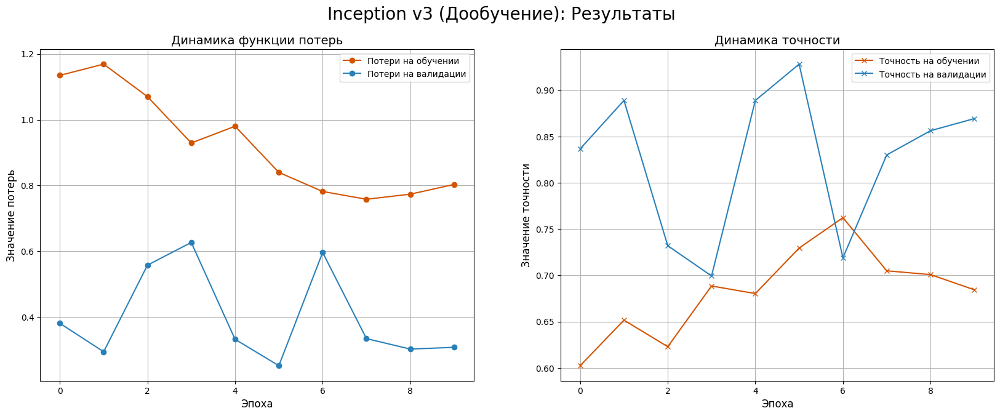

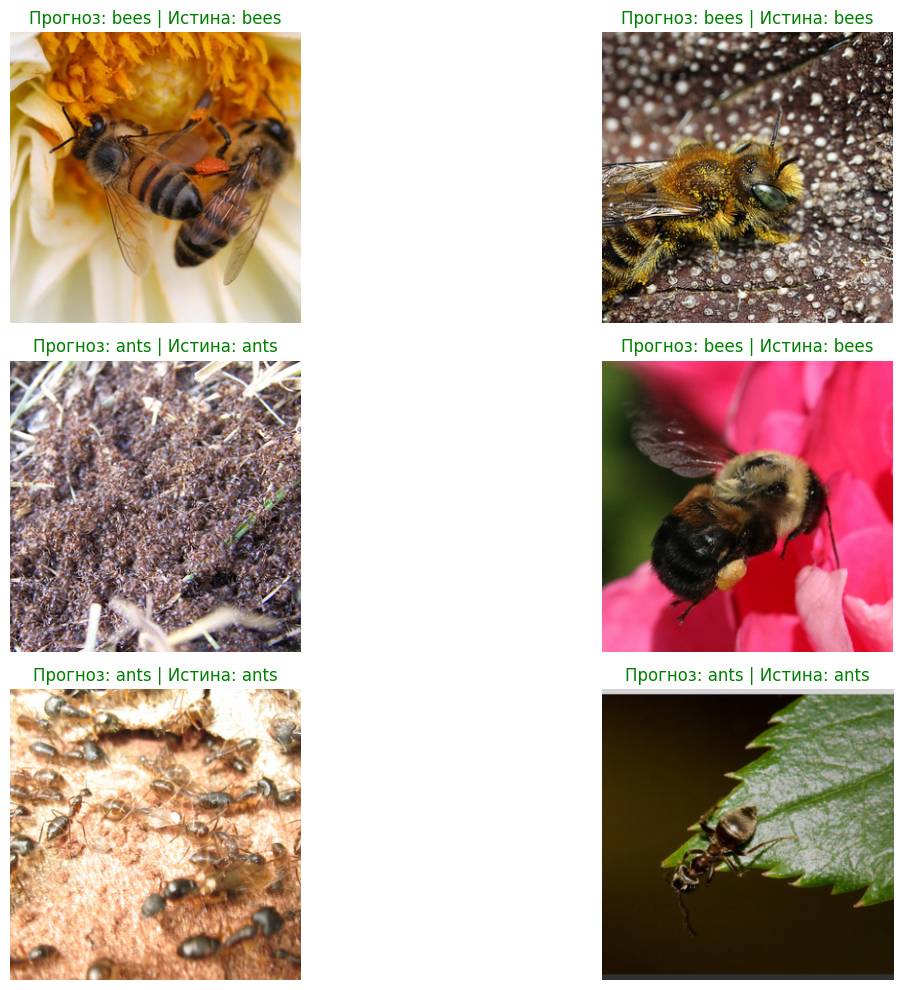

In [17]:
model_inception_v3 = models.inception_v3(weights=models.Inception_V3_Weights.DEFAULT)

# Модифицируем классификаторы
aux_num_ftrs = model_inception_v3.AuxLogits.fc.in_features
model_inception_v3.AuxLogits.fc = nn.Linear(aux_num_ftrs, len(class_names))
main_num_ftrs = model_inception_v3.fc.in_features
model_inception_v3.fc = nn.Linear(main_num_ftrs, len(class_names))
model_inception_v3 = model_inception_v3.to(device)

criterion = nn.CrossEntropyLoss()

# Оптимизируем все параметры сети
optimizer_inc_v3 = optim.SGD(model_inception_v3.parameters(), lr=0.001, momentum=0.9)
scheduler_inc_v3 = lr_scheduler.StepLR(optimizer_inc_v3, step_size=7, gamma=0.1)

print("Начинаем дообучение (fine-tuning) модели Inception v3...")
model_inception_v3, history_inc_v3 = train_model(model_inception_v3, criterion, optimizer_inc_v3, scheduler_inc_v3,
                                                 dataloaders_299, dataset_sizes_299, num_epochs=10, is_inception=True)

plot_history(history_inc_v3, "Inception v3 (Дообучение): Результаты")
visualize_model_predictions(model_inception_v3, dataloaders_299['val'])